In [1]:
# https://campus.datacamp.com/courses/interactive-data-visualization-with-bokeh/

# What are glyphs?
## In Bokeh, visual properties of shapes are called glyphs

In [2]:
# fix sos adjem/ncsos adejm in title

# A simple scatter plot

# Import figure from bokeh.plotting
from bokeh.plotting import figure

# Import output_file and show from bokeh.io
from bokeh.io import output_file, show, output_notebook
import bokeh.plotting as bk
bk.output_notebook()

Loading BokehJS ...

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set()


In [4]:
kenpom_df = pd.DataFrame.from_csv('../../basketball/resources/KenPom_historic_data.csv')
kenpom_df.columns

Index(['Rank', 'Team', 'Conf', 'AdjEM', 'AdjO', 'AdjO_Rank', 'AdjD',
       'AdjD_Rank', 'AdjT', 'AdjT_Rank', 'Luck', 'Luck_Rank', 'AdjEM.1',
       'AdjEM_Rank', 'OppO', 'OppO_Rank', 'OppD', 'OppD_Rank', 'AdjEM.2',
       'AdjEM_Rank.1', 'Year', 'W', 'L'],
      dtype='object')

# Lesson 1: Basic plotting with Bokeh

In [5]:
# We can look at AdjEM (adjusted efficiency margin) compared vs wins

# Create the figure: p
p = figure(x_axis_label='AdjEM', y_axis_label='W', title='Adjem vs Wins in KenPom Database (since 2002)')

# Add a circle glyph to the figure p
p.circle(kenpom_df.AdjEM, kenpom_df.W)

# Display the plot
show(p)

## A scatter plot with different shapes
By calling multiple glyph functions on the same figure object, we can overlay multiple data sets in the same figure.



In [6]:
# want a smaller df here- top 25 teams per year
df = kenpom_df[kenpom_df.Rank < 26]
df['W_Pct'] = df['W'] / (df['L'] + df['W'])

# Create the figure: p
p = figure(x_axis_label='Adj Offense/Defense', y_axis_label='W_Pct', title='AdjO/AdjD for Top 25 Kenpom Teams since 2002')

# Add a circle glyph to the figure p
p.circle(df.AdjO, df.W_Pct)

# Add an x glyph to the figure p
p.x(df.AdjD, df.W_Pct)

show(p)

/Users/joelelster/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


## Customizing your scatter plots
The three most important arguments to customize scatter glyphs are color, size, and alpha. Bokeh accepts colors as hexadecimal strings, tuples of RGB values between 0 and 255, and any of the 147 CSS color names. Size values are supplied in screen space units with 100 meaning the size of the entire figure.

The alpha parameter controls transparency. It takes in floating point numbers between 0.0, meaning completely transparent, and 1.0, meaning completely opaque.

In [7]:
# want a smaller df here- top 25 teams per year
df = kenpom_df[kenpom_df.Rank < 11]
df['W_Pct'] = df['W'] / (df['L'] + df['W'])

# Create the figure: p
p = figure(x_axis_label='Adj Offense/Defense', y_axis_label='W_Pct', title='AdjO/AdjD+ for Top 10 Kenpom Teams since 2002 (> 100 is above average)')

# Add a circle glyph to the figure p
p.circle(df.AdjO, df.W_Pct, legend='Adj O', color='blue')

# Add an x glyph to the figure p
p.circle((100 + (df.AdjD - 100) * -1) , df.W_Pct, legend='Adj D', color='red')

show(p)

/Users/joelelster/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


# Additional glyphs:

plot.line, etc..

can stack plots on top of eachother (ie line w/ circle on top)

Patches: useful for showing geographic regions:
        Data is list of lists

# Lines
We can draw lines on Bokeh plots with the line() glyph function.

In this exercise, you'll plot the daily adjusted closing price of Apple Inc.'s stock (AAPL) from 2000 to 2013.

The data points are provided for you as lists. date is a list of datetime objects to plot on the x-axis and price is a list of prices to plot on the y-axis.

Since we are plotting dates on the x-axis, you must add x_axis_type='datetime' when creating the figure object.

In [9]:
# Timeseries data

# Import figure from bokeh.plotting
from bokeh.plotting import figure

df = kenpom_df[kenpom_df.Team == 'Michigan']

# Create a figure with x_axis_type="datetime": p # 'datetime' led to incorrect axis label
p = figure(x_axis_type='linear', x_axis_label='Year', y_axis_label='AdjO')

# Plot date along the x axis and AdjO along the y axis
p.line(df.Year, df.AdjO, color='blue', legend='AdjO')
p.line(df.Year, 100 + (100 - df.AdjD), color='black', legend='AdjD+')
p.line(df.Year, df.Rank, color='red', legend='Overall Rank')

# Specify the name of the output file and show the result
show(p)


# Lines and markers
Lines and markers can be combined by plotting them separately using the same data points.

In this exercise, you'll plot a line and circle glyph for the AAPL stock prices. Further, you'll adjust the fill_color keyword argument of the circle() glyph function while leaving the line_color at the default value.

In [10]:
# Bringing in price/date data

import datetime

# Creating price list
with open('./Resources/price') as f:
    price = []
    price.append(f.read().splitlines())
    price = price[0]
    
# Creating apple stock list
with open('./Resources/date.txt') as f:
    date = []
    date.append(f.read().splitlines())
    date = date[0]
for num,row in enumerate(date):
    row = row.split(",")
    row = (datetime.datetime(int(row[0]), int(row[1]), int(row[2])))
    date[num] = row

In [11]:
# Redoing timeseries data with stock info. Missing some data from datacamp

# Create a figure with x_axis_type="datetime": p
p = figure(x_axis_type='datetime', x_axis_label='Date', y_axis_label='US Dollars')

# Plot date along the x axis and price along the y axis
p.line(date, price)

# Specify the name of the output file and show the result
show(p)

/Users/joelelster/anaconda/lib/python3.6/site-packages/bokeh/models/sources.py:89: BokehUserWarning: ColumnDataSource's columns must be of the same length
  lambda: warnings.warn("ColumnDataSource's columns must be of the same length", BokehUserWarning))
/Users/joelelster/anaconda/lib/python3.6/site-packages/bokeh/core/json_encoder.py:73: FutureWarning: pandas.tslib is deprecated and will be removed in a future version.
You can access Timestamp as pandas.Timestamp
  if pd and isinstance(obj, pd.tslib.Timestamp):


In [12]:
# Create a figure with x_axis_type='datetime': p
p = figure(x_axis_type='datetime', x_axis_label='Date', y_axis_label='US Dollars')

# Plot date along the x-axis and price along the y-axis
p.line(date, price)

# With date on the x-axis and price on the y-axis, add a white circle glyph of size 4
p.circle(date, price, fill_color='white', size=4)

# Specify the name of the output file and show the result
show(p)

/Users/joelelster/anaconda/lib/python3.6/site-packages/bokeh/models/sources.py:89: BokehUserWarning: ColumnDataSource's columns must be of the same length
  lambda: warnings.warn("ColumnDataSource's columns must be of the same length", BokehUserWarning))
/Users/joelelster/anaconda/lib/python3.6/site-packages/bokeh/models/sources.py:89: BokehUserWarning: ColumnDataSource's columns must be of the same length
  lambda: warnings.warn("ColumnDataSource's columns must be of the same length", BokehUserWarning))


In [13]:
# Redoing KenPom data with overlay

# Timeseries data

df = kenpom_df[kenpom_df.Team == 'Michigan']

# Create a figure with x_axis_type="datetime": p # 'datetime' led to incorrect axis label
p = figure(x_axis_type='linear', x_axis_label='Year', y_axis_label='AdjO')

# Plot date along the x axis and AdjO along the y axis
p.line(df.Year, df.AdjO, color='blue', legend='AdjO')
p.circle(df.Year, df.AdjO, fill_color='blue')

p.line(df.Year, 100 + (100 - df.AdjD), color='black', legend='AdjD+')
p.x(df.Year, 100 + (100 - df.AdjD), fill_color='black')

p.line(df.Year, df.Rank, color='red', legend='Overall Rank')
p.square(df.Year, df.Rank, fill_color='red')

# Specify the name of the output file and show the result
show(p)


# Patches
In Bokeh, extended geometrical shapes can be plotted by using the patches() glyph function. The patches glyph takes as input a list-of-lists collection of numeric values specifying the vertices in x and y directions of each distinct patch to plot.

In this exercise, you will plot the state borders of Arizona, Colorado, New Mexico and Utah. The latitude and longitude vertices for each state have been prepared as lists.

In [30]:
# paste coords text file for lats/lons
# './Resources/coords

# Create a list of az_lons, co_lons, nm_lons and ut_lons: x
x = [az_lons, co_lons, nm_lons, ut_lons]

# Create a list of az_lats, co_lats, nm_lats and ut_lats: y
y = [az_lats, co_lats, nm_lats, ut_lats]

# Add patches to figure p with line_color=white for x and y
p = figure(x_axis_label='Lon', y_axis_label='Lat')
p.patches(x,y, line_color='white')

# Specify the name of the output file and show the result
show(p)

## Data Formats for Bokeh
Standard python list, numpy arrays (ie linspace), pandas df...

Column Data Source- stripped down dataframe. often created automatically for you

Can be shared between glyphs to link selections, add extra columns for hovertools

from bokeh.models import ColumnDataSource

source = ColumnDataSource(data={'x': [1,2,3,4], y: [1,2,3,4]})

all columns in CDS must be same length

### There is sample data available:
#### from bokeh.sampledata.iris import flowers as df
#### source = ColumnDataSource(df)

# Plotting data from NumPy arrays
In the previous exercises, you made plots using data stored in lists. You learned that Bokeh can plot both numbers and datetime objects.

In this exercise, you'll generate NumPy arrays using np.linspace() and np.cos() and plot them using the circle glyph.

np.linspace() is a function that returns an array of evenly spaced numbers over a specified interval. For example, np.linspace(0, 10, 5) returns an array of 5 evenly spaced samples calculated over the interval [0, 10]. np.cos(x) calculates the element-wise cosine of some array x.



In [15]:
# Create array using np.linspace: x
x = np.linspace(0,5,100)

# Create array using np.cos: y
y = np.cos(x)

# Add circles at x and y
p = figure()
p.circle(x,y)

show(p)

# Plotting data from Pandas DataFrames
You can create Bokeh plots from Pandas DataFrames by passing column selections to the glyph functions.

Bokeh can plot floating point numbers, integers, and datetime data types.


In [16]:
# Create list of rankings so can be color coded

def ranking(text):
    rank_list = []
    for rank in text:
        if rank < 26:
            rank_list.append('red')#('Top_25')
        elif rank < 51:
            rank_list.append('orange')#('25-50')
        elif rank < 101:
            rank_list.append('yellow')#('50-100')
        elif rank < 151:
            rank_list.append('green')#('100-150')
        elif rank < 251:
            rank_list.append('blue')#('150-250')
        else:
            rank_list.append('black')#('250+')
    return rank_list

In [115]:
# Create list of rankings so can be color coded

def tourney_round(wins_text):
    if wins_text == -1:
        return 'red' # no tourney wins/r64
    elif wins_text == 1: # made r32
        return 'red'
    elif wins_text == 2: # made s16
        return 'orange'
    elif wins_text == 3: # made e8
        return 'orange'
    elif wins_text == 4: # made ff
        return 'green'
    elif wins_text == 5: # made champs
        return 'green'
    elif wins_text == 6: # won champs
        return 'green'
    else:
        return 'black' # missed tourney

In [230]:
df.columns# Color coding
df = kenpom_df
df['Rank_class'] = ranking(df.Rank)

p = figure(x_axis_label='AdjO', y_axis_label='AdjD+', title='AdjO/D colored by KenPom Ranking')

# Plot mpg vs hp by color
p.circle(df.AdjO, 200 - df.AdjD, color=df['Rank_class'], size=3)

show(p)

In [232]:
# Color coding
df = kenpom_df
df['Rank_class'] = ranking(df.Rank)

p = figure(x_axis_label='AdjEM', y_axis_label='Win %', title='AdjO/D colored by KenPom Ranking')

# Plot mpg vs hp by color

p.circle(df.AdjEM, df.W/(df.W + df.L), color=df['Rank_class'], size=3)
show(p)

In [20]:
teams = pd.read_csv('../../../Downloads/Teams.csv')
teams = teams.set_index('Team_Id')

In [21]:
teams.T

Team_Id,1101,1102,1103,1104,1105,1106,1107,1108,1109,1110,...,1455,1456,1457,1458,1459,1460,1461,1462,1463,1464
Team_Name,Abilene Chr,Air Force,Akron,Alabama,Alabama A&M,Alabama St,Albany NY,Alcorn St,Alliant Intl,American Univ,...,Wichita St,William & Mary,Winthrop,Wisconsin,Wofford,Wright St,Wyoming,Xavier,Yale,Youngstown St


In [92]:
tourney_results_win = pd.read_csv('../../../Downloads/TourneyCompactResults.csv')

# Eliminate playin games
tourney_results_win = tourney_results_win[tourney_results_win.Daynum > 135]

# grouping by winning team/season 
tourney_results_win = tourney_results_win.groupby(['Wteam', 'Season']).count()[['Numot']]

tourney_results_win = tourney_results_win.reset_index().set_index('Wteam')

tourney_results_win.columns = ['Year', 'Wins']

tourney_results_win = tourney_results_win[tourney_results_win.Year > 2001]

tourney_results_win = tourney_results_win.join(teams)

tourney_results_win.columns = ['Year', 'Tourney_Wins', 'Team']

tourney_results_win = tourney_results_win.set_index(['Team', 'Year'])

# list of tourney_losses (to seperate tourney teams from non tourney teams)

tourney_results_loss = pd.read_csv('../../../Downloads/TourneyCompactResults.csv')

# list of teams who lost game in tourney
tourney_results_loss = tourney_results_loss.groupby(['Lteam', 'Season']).count()[['Numot']]

tourney_results_loss = tourney_results_loss.reset_index().set_index('Lteam')
tourney_results_loss = tourney_results_loss.join(teams)

tourney_results_loss.columns = ['Year', 'Tourney_Loss', 'Team']

tourney_results_loss = tourney_results_loss.set_index(['Team', 'Year'])
tourney_results_loss.head()

# concat together to get list of tourney teams
tourney_results = pd.concat([tourney_results_win, tourney_results_loss], axis=1)

# Return -1 for team that made tourney but did not win
tourney_status = []
for win,loss in tourney_results.values:
    if win > 0:
        tourney_status.append(int(win))
    else:
        tourney_status.append(-1)
        
tourney_results['Status'] = tourney_status

In [93]:
tourney_results.head()

Tourney_Wins  Tourney_Loss  Status
Team      Year                                    
Air Force 2004           NaN           1.0      -1
          2006           NaN           1.0      -1
Akron     1986           NaN           1.0      -1
          2009           NaN           1.0      -1
          2011           NaN           1.0      -1

In [118]:
# AdjO/AdjD as measure of Tourney Success

df = kenpom_df[kenpom_df.Year < 2017]
df = df.set_index(['Team', 'Year'])
df = df.join(tourney_results)
df['Tourney_Wins'] = df['Tourney_Wins'].astype(int, errors='ignore')
df.dropna()

df['Tourney_Round'] = df.Status.apply(tourney_round)


p = figure(x_axis_label='AdjO', y_axis_label='AdjD+', title='AdjO/D colored by Tourney Wins')

# Plot mpg vs hp by color

p.circle(df.AdjO, 200 - df.AdjD, color=df['Tourney_Round'], size=3)
show(p)

In [124]:
# AdjEM/Wins as measure of Tourney Success

df = kenpom_df[kenpom_df.Year < 2017]
df = df.set_index(['Team', 'Year'])
df = df.join(tourney_results)
df['Tourney_Wins'] = df['Tourney_Wins'].astype(int, errors='ignore')

df['Tourney_Round'] = df.Status.apply(tourney_round)


p = figure(x_axis_label='AdjEM', y_axis_label='Wins %', title='AdjEM/Wins colored by Tourney Benchmark')

# Plot mpg vs hp by color

p.circle(df.AdjEM, df.W / (df.W + df.L), color=df['Tourney_Round'], size=3)
show(p)

In [166]:
# AdjEM/Rank as measure of Tourney Success

df = kenpom_df[kenpom_df.Year < 2017]
df = df.set_index(['Team', 'Year'])
df = df.join(tourney_results)
df['Tourney_Wins'] = df['Tourney_Wins'].astype(int, errors='ignore')

df['Tourney_Round'] = df.Status.apply(tourney_round)


p = figure(x_axis_label='AdjEM', y_axis_label='Rank', title='AdjEM/Wins colored by Tourney Benchmark')

# Plot mpg vs hp by color

p.circle(df.AdjEM, df.Rank, color=df['Tourney_Round'], size=3)
show(p)

In [151]:
# Greatest teams not to make FF

df = kenpom_df[kenpom_df.Year < 2017]
df = df.set_index(['Team', 'Year'])
df = df.join(tourney_results)
df['Tourney_Wins'] = df['Tourney_Wins'].astype(int, errors='ignore')
df.dropna()

df['Tourney_Round'] = df.Status.apply(tourney_round)
df = df[['Rank', 'AdjEM', 'Tourney_Wins']]
#df = df.fillna(0)
df[df.Tourney_Wins < 4].sort_values('AdjEM', ascending=False).head()

,,Rank,AdjEM,Tourney_Wins
Team,Year,,,
Duke,2002,1,34.19,2.0
Arizona,2015,4,32.36,3.0
Kansas,2010,2,31.85,1.0
North Carolina,2007,1,31.37,3.0
Florida,2013,2,31.18,3.0


# The Bokeh ColumnDataSource (continued)
You can create a ColumnDataSource object directly from a Pandas DataFrame by passing the DataFrame to the class initializer.

In this exercise, we have imported pandas as pd and read in a data set containing all Olympic medals awarded in the 100 meter sprint from 1896 to 2012. A color column has been added indicating the CSS colorname we wish to use in the plot for every data point.

Your job is to import the ColumnDataSource class, create a new ColumnDataSource object from the DataFrame df, and plot circle glyphs with 'Year' on the x-axis and 'Time' on the y-axis. Color each glyph by the color column.



In [228]:
# Fun with Column Data Source

# setting df
df = kenpom_df[kenpom_df.Year < 2017]
df = df.set_index(['Team', 'Year'])
df = df.join(tourney_results)
df['Tourney_Wins'] = df['Tourney_Wins'].astype(int, errors='ignore')
df.dropna()
df['Tourney_Round'] = df.Status.apply(tourney_round)

# Import the ColumnDataSource class from bokeh.plotting
from bokeh.plotting import ColumnDataSource

# Create a ColumnDataSource from df: source
source = ColumnDataSource(df)

# create figure
p = figure(x_axis_label='AdjEM', y_axis_label='Rank', title='AdjEM/Wins colored by Tourney Benchmark')

# Add circle glyphs to the figure p
p.circle('AdjEM', 'Rank', source=source, color='Tourney_Round', size=3)

show(p)

In [182]:
# Using Column Data Source, we do not have to rerun the dataframe each time, instead specify source=source

# example. # can not alter columns

p = figure(x_axis_label='AdjO', y_axis_label='AdjD', title='AdjEM/Wins colored by Tourney Benchmark')

# Add circle glyphs to the figure p
p.circle('AdjO', 'AdjD', source=source, color='Tourney_Round', size=3)

show(p)

# Video: Customizing Glyphs

Hover/selection to change glyphs


### Select
plot = figure(tools='box_select, lasso_select')

When points are selected, can specify how to fill non-selected points

selection_color= '', nonselection_fill_alpha=int, nonselection_fill_color=''


### Hover
from bokeh.models import HoverTool

hover = HoverTool(tooltips=None, mode='hline')

plot = figure(tools=[hover, 'crosshair'])

can also specify hover policy: hover_color=''

### Color Mapping
from bokeh.models import CategoricalColorMapper

mapper = CategoricalCOlorMapper(factors=[], palette=[])

can also use: color={'field': 'column_name', 'transform': mapper}

# Selection and non-selection glyphs
In this exercise, you're going to add the box_select tool to a figure and change the selected and non-selected circle glyph properties so that selected glyphs are red and non-selected glyphs are transparent blue.

You'll use the ColumnDataSource object of the Olympic Sprint dataset you made in the last exercise. It is provided to you with the name source.

After you have created the figure, be sure to experiment with the Box Select tool you added! As in previous exercises, you may have to scroll down to view the lower portion of the figure.

In [196]:
# Create a figure with the "box_select" tool: p
p = figure(x_axis_label='AdjO', y_axis_label='Rank', tools='box_select')

# Add circle glyphs to the figure p with the selected and non-selected properties
p.circle('AdjO', 'Rank', selection_color='red', nonselection_alpha=0.1, source=source)

show(p)

# can box select points that turn red

# Hover glyphs
Now let's practice using and customizing the hover tool.

In this exercise, you're going to plot the blood glucose levels for an unknown patient. The blood glucose levels were recorded every 5 minutes on October 7th starting at 3 minutes past midnight.

The date and time of each measurement are provided to you as x and the blood glucose levels in mg/dL are provided as y.

A bokeh figure is also provided in the workspace as p.

Your job is to add a circle glyph that will appear red when the mouse is hovered near the data points. You will also add a customized hover tool object to the plot.

When you're done, play around with the hover tool you just created! Notice how the points where your mouse hovers over turn red.



In [202]:
# import the HoverTool
from bokeh.models import HoverTool

p = figure(x_axis_label = 'Lat', y_axis_label = 'Lon')
# Add circle glyphs to figure p
p.circle(az_lats, az_lons, size=10,
         fill_color='grey', alpha=0.7, line_color='blue',
         hover_fill_color='firebrick', hover_alpha=0.5,
         hover_line_color='white')

# Create a HoverTool: hover
hover = HoverTool(tooltips=None, mode='vline')

# Add the hover tool to the figure p
p.add_tools(hover)

# Specify the name of the output file and show the result
show(p)


# Colormapping
The final glyph customization we'll practice is using the CategoricalColorMapper to color each glyph by a categorical property.

Here, you're going to use the automobile dataset to plot miles-per-gallon vs weight and color each circle glyph by the region where the automobile was manufactured.

The origin column will be used in the ColorMapper to color automobiles manufactured in the US as blue, Europe as red and Asia as green.

The automobile data set is provided to you as a Pandas DataFrame called df. The figure is provided for you as p.

In [280]:
#Import CategoricalColorMapper from bokeh.models
from bokeh.models import CategoricalColorMapper

df = tourney_df.fillna(0)

# Convert df to a ColumnDataSource: source
source = ColumnDataSource(df)

# Make a CategoricalColorMapper object: color_mapper
color_mapper = CategoricalColorMapper(factors=[-1,0,1,2,3,4,5,6],
                                      palette=['red','black','blue','blue','blue','blue','blue','blue'])

p = figure()
# Add a circle glyph to the figure p
p.circle('AdjO', 'Rank', source=source,
            color=dict(field='Status', transform=color_mapper),
            legend='Status')

show(p)

# Part 2:
## Layouts, Interactions, and Annotations

### introduction to layouts:
sliders, menus, multiple plots

#### Arrange plots(and controls) visually on page:
row/columns

grid arragnements

tabbed layouts

from bokeh.layouts import row, column..
rows and columns can be bested for more sophisticated layouts

layout = row(column(p1,p2), p3)

show(layout)

# Creating rows of plots
Layouts are collections of Bokeh figure objects.

In this exercise, you're going to create two plots from the Literacy and Birth Rate data set to plot fertility vs female literacy and population vs female literacy.

By using the row() method, you'll create a single layout of the two figures.

Remember, as in the previous chapter, once you have created your figures, you can interact with them in various ways.

In this exercise, you may have to scroll sideways to view both figures in the row layout. Alternatively, you can view the figures in a new window by clicking on the expand icon to the right of the "Bokeh plot" tab.

In [221]:
# Before moving onwards, lets define a few terms for ease of use

tourney_df = kenpom_df[kenpom_df.Year < 2017]
tourney_df = tourney_df.set_index(['Team', 'Year'])
tourney_df = tourney_df.join(tourney_results)
tourney_df['Tourney_Wins'] = tourney_df['Tourney_Wins'].astype(int, errors='ignore')

tourney_df['Tourney_Round'] = tourney_df.Status.apply(tourney_round)

In [223]:
# Import row from bokeh.layouts
from bokeh.layouts import row
source = ColumnDataSource(tourney_df)

# Create the first figure: p1
p1 = figure(x_axis_label='AdjO', y_axis_label='Rank')

# Add a circle glyph to p1
p1.circle('AdjO', 'Rank', source=source)

# Create the second figure: p2
p2 = figure(x_axis_label='AdjD', y_axis_label='Rank')

# Add a circle glyph to p2
p2.circle('AdjD', 'Rank', source=source)

# Put p1 and p2 into a horizontal row: layout
layout = row(p1,p2)

show(layout)

# Creating columns of plots
In this exercise, you're going to use the column() function to create a single column layout of the two plots you created in the previous exercise.

You may have to scroll down to view the lower portion of the figure.

In [227]:
# Import row from bokeh.layouts
from bokeh.layouts import column
source = ColumnDataSource(tourney_df)

# Create the first figure: p1
p1 = figure(x_axis_label='AdjO', y_axis_label='Rank')

# Add a circle glyph to p1
p1.circle('AdjO', 'Rank', source=source)

# Create the second figure: p2
p2 = figure(x_axis_label='AdjD', y_axis_label='Rank')

# Add a circle glyph to p2
p2.circle('AdjD', 'Rank', source=source)

# Put p1 and p2 into a horizontal row: layout
layout = column(p1,p2)

show(layout)

# Nesting rows and columns of plots
You can create nested layouts of plots by combining row and column layouts.

In this exercise, you'll make a 3-plot layout in two rows using the auto-mpg data set.

Three plots have been created for you of average mpg vs year, mpg vs hp, and mpg vs weight.

Your job is to use the column() and row() functions to make a two-row layout where the first row will have only the average mpg vs year plot and the second row will have mpg vs hp and mpg vs weight plots as columns.

By using the sizing_mode argument, you can scale the widths to fill the whole figure.

In [263]:
from bokeh.layouts import column, row
df = tourney_df

# creating 3 figures
p1 = figure(x_axis_label='AdjEM', y_axis_label='Win %')
p1.circle(df.AdjEM, df.W / (df.W + df.L))

p2 = figure(x_axis_label='AdjEM', y_axis_label='AdjO')
p2.circle(df.AdjEM, df.AdjO)

p3 = figure(x_axis_label='AdjEM', y_axis_label='AdjD+')
p3.circle(df.AdjEM, 200 - df.AdjD)

# Make a column layout that will be used as the second row: row2
row2 = column([p2, p3], sizing_mode='scale_width')

# Make a row layout that includes the above column layout: layout
layout = row([p1, row2], sizing_mode='scale_width')

show(layout)

## Advanced Layouts

### Gridplots
pass list of lists where each inner list is plot to display

### Tabbed Layouts

# Creating gridded layouts
Regular grids of Bokeh plots can be generated with gridplot.

In this example, you're going to display four plots of fertility vs female literacy for four regions: Latin America, Africa, Asia and Europe.

Your job is to create a list-of-lists for the four Bokeh plots that have been provided to you as p1, p2, p3 and p4. The list-of-lists defines the row and column placement of each plot.



In [271]:
# Import gridplot from bokeh.layouts
from bokeh.layouts import gridplot

df = tourney_df

# creating 4 figures
# Non Tourney
df = tourney_df.fillna(0)
df = df[df.Status == 0]

p1 = figure(x_axis_label='AdjO', y_axis_label='AdjD+', title='Missed Tourney')
p1.circle(df.AdjO, 200 - df.AdjD)


# R64

df = tourney_df
df = df[(df.Status < 3) & (df.Status > 0)]

p2 = figure(x_axis_label='AdjO', y_axis_label='AdjD+', title='R1/R2')
p2.circle(df.AdjO, 200 - df.AdjD)


# S16
df = tourney_df
df = df[df.Status > 2]

p3 = figure(x_axis_label='AdjEM', y_axis_label='AdjD+', title='Sweet 16')
p3.circle(df.AdjO, 200 - df.AdjD)


# E8 onwards

df = tourney_df
df = df[(df.Status > 4)]

p4 = figure(x_axis_label='AdjO', y_axis_label='AdjD+', title='Elite 8+')
p4.circle(df.AdjO, 200 - df.AdjD)

# create two lists of plots

row1 = [p1, p2]
row2 = [p3, p4]

# creating gridplot
layout = gridplot([row1, row2])

# showing
show(layout)

# Starting tabbed layouts
Tabbed layouts can be created in Pandas by placing plots or layouts in Panels.

In this exercise, you'll take the four fertility vs female literacy plots from the last exercise and make a Panel() for each.

No figure will be generated in this exercise. Instead, you will use these panels in the next exercise to build and display a tabbed layout.

In [272]:
# Import Panel from bokeh.models.widgets
from bokeh.models.widgets import Panel

# Create tab1 from plot p1: tab1
tab1 = Panel(child=p1, title='Missed Tourney')

# Create tab2 from plot p2: tab2
tab2 = Panel(child=p2, title='R1/R2')

# Create tab3 from plot p3: tab3
tab3 = Panel(child=p3, title='Sweet 16')

# Create tab4 from plot p4: tab4
tab4 = Panel(child=p4, title='Elite 8')

# Displaying tabbed layouts
Tabbed layouts are collections of Panel objects. Using the figures and Panels from the previous two exercises, you'll create a tabbed layout to change the region in the fertility vs female literacy plots.

Your job is to create the layout using Tabs() and assign the tabs keyword argument to your list of Panels. The Panels have been created for you as tab1, tab2, tab3 and tab4.

After you've displayed the figure, explore the tabs you just added! The "Pan", "Box Zoom" and "Wheel Zoom" tools are also all available as before.

In [282]:
from bokeh.models.widgets import Tabs

# Create a Tabs layout: layout
layout = Tabs(tabs=[tab1, tab2, tab3, tab4])

show(layout)

# hover, etc.. tools not showing up

## Linking Plots Together
#### Linking Axes:
p1.x_range = p2.x_range = p3.x_range

#### Linked Selections (brushing?)
using source=source allows to select data from plot to plot

# Linked axes
Linking axes between plots is achieved by sharing range objects.

In this exercise, you'll link four plots of female literacy vs fertility so that when one plot is zoomed or dragged, one or more of the other plots will respond.

The four plots p1, p2, p3 and p4 along with the layout that you created in the last section have been provided for you.

Your job is link p1 with the three other plots by assignment of the .x_range and .y_range attributes.

After you have linked the axes, explore the plots by clicking and dragging along the x or y axes of any of the plots, and notice how the linked plots change together.



In [284]:
# Link the x_range of p2 to p1: p2.x_range
p2.x_range = p1.x_range

# Link the y_range of p2 to p1: p2.y_range
p2.y_range = p1.y_range

# Link the x_range of p3 to p1: p3.x_range
p3.x_range = p1.x_range

# Link the y_range of p4 to p1: p4.y_range
p4.y_range = p1.y_range


# create two lists of plots

row1 = [p1, p2]
row2 = [p3, p4]

# creating gridplot
layout = gridplot([row1, row2])

show(layout)

# Linked brushing
By sharing the same ColumnDataSource object between multiple plots, selection tools like BoxSelect and LassoSelect will highlight points in both plots that share a row in the ColumnDataSource.

In this exercise, you'll plot AdjO vs AdjEM and AdjD vs AdjEM in two plots using the same ColumnDataSource.

After you have built the figure, experiment with the Lasso Select and Box Select tools. Use your mouse to drag a box or lasso around points in one figure, and notice how points in the other figure that share a row in the ColumnDataSource also get highlighted.

Before experimenting with the Lasso Select, however, click the Bokeh plot pop-out icon to pop out the figure so that you can definitely see everything that you're doing.


In [300]:
# Create ColumnDataSource: source
df = tourney_df
df['AdjO/D'] = df.AdjO / df.AdjD
source = ColumnDataSource(df)

# Create the first figure: p1
p1 = figure(x_axis_label='AdjEM', y_axis_label='AdjD-',
            tools='box_select,lasso_select')

# Add a circle glyph to p1
p1.circle('AdjEM', 'AdjD', source=source, fill_color='Tourney_Round')

# Create the second figure: p2
p2 = figure(x_axis_label='AdjEM', y_axis_label='Adjusted Tempo (Possesions/40)',
            tools='box_select,lasso_select')

# Add a circle glyph to p2
p2.circle('AdjEM', 'AdjT', source=source, fill_color='Tourney_Round')

# Create row layout of figures p1 and p2: layout
layout = row([p1, p2])

# Specify the name of the output_file and show the result
show(layout)

# Annotations and Guides
Axes, Grids (Default on most plots)

Explain visual encodings: legends
    
Hover Tooltips to drill down into details not visible in plot

hover = HoverTool(tooltips = [('col1', '@col1'), ('col2', '@col2')])

plot = figure(tools=[hover, 'pan', 'wheel_zoom'])

# How to create legends
Legends can be added to any glyph by using the legend keyword argument.

In this exercise, you will plot two circle glyphs for AdjO vs AdjD for Top .

Two ColumnDataSources called latin_america and africa have been provided.

Your job is to plot two circle glyphs for these two objects with fertility on the x axis and female_literacy on the y axis and add the legend values. The figure p has been provided for you.

# How to create legends
Legends can be added to any glyph by using the legend keyword argument.

In this exercise, you will plot two circle glyphs for female literacy vs fertility in Africa and Latin America.

Two ColumnDataSources called latin_america and africa have been provided.

Your job is to plot two circle glyphs for these two objects with fertility on the x axis and female_literacy on the y axis and add the legend values. The figure p has been provided for you.

# Legend Positioning

Positioning and styling legends
Properties of the legend can be changed by using the legend member attribute of a Bokeh figure after the glyphs have been plotted.

In [307]:
# Add the first circle glyph to the figure 
df = tourney_df.fillna(0)
tourney_teams = ColumnDataSource(df[df.Status != 0])
missed_teams = ColumnDataSource(df[df.Status == 0])
p = figure()

# plot missed teams first, so they will be on back
p.circle('AdjO', 'AdjD', source=missed_teams, size=10, color='black', legend='Missed')

# plot tourney teams
p.circle('AdjO', 'AdjD', source=tourney_teams, size=10, color='red', legend='Tourney', alpha=0.5)

# Assign the legend to the bottom left: p.legend.location
p.legend.location = 'bottom_left'

# Fill the legend background with the color 'lightgray': p.legend.background_fill_color
p.legend.background_fill_color = 'lightgray'

show(p)

# Adding a hover tooltip
Working with the HoverTool is easy for data stored in a ColumnDataSource.

In this exercise, you will create a HoverTool object and display the country for each circle glyph in the figure that you created in the last exercise. This is done by assigning the tooltips keyword argument to a list-of-tuples specifying the label and the column of values from the ColumnDataSource using the @ operator.

The figure object has been prepared for you as p.

After you have added the hover tooltip to the figure, be sure to interact with it by hovering your mouse over each point to see which country it represents.


In [313]:
# From Above 

# Add the first circle glyph to the figure 
df = tourney_df.fillna(0)
df = df.reset_index()
tourney_teams = ColumnDataSource(df[df.Status != 0])
missed_teams = ColumnDataSource(df[df.Status == 0])
p = figure()

# plot missed teams first, so they will be on back
p.circle('AdjO', 'AdjD', source=missed_teams, size=10, color='black', legend='Missed')

# plot tourney teams
p.circle('AdjO', 'AdjD', source=tourney_teams, size=10, color='red', legend='Tourney', alpha=0.5)

# Assign the legend to the bottom left: p.legend.location
p.legend.location = 'bottom_left'

# Fill the legend background with the color 'lightgray': p.legend.background_fill_color
p.legend.background_fill_color = 'lightgray'

# ----------------


# Import HoverTool from bokeh.models
from bokeh.models import HoverTool

# Create a HoverTool object: hover
hover = HoverTool(tooltips=[('Team', '@Team'),('Wins', '@Status')])

# Add the HoverTool object to figure p
p.add_tools(hover)

show(p)

In [ ]:
# Thoughts

# -------------

-----------

In [26]:
# Create the figure: p
p = figure(x_axis_label='AdjEM', y_axis_label='W')

# Add a circle glyph to the figure p
p.circle(kenpom_df['AdjEM'], kenpom_df['W'])

# Call the output_file() function and specify the name of the file
output_notebook()

# Display the plot
show(p)



Loading BokehJS ...

In [285]:
# Look at tempo

In [27]:
# Create the figure: p
p = figure(x_axis_label='AdjO', y_axis_label='AdjD')

# Add a circle glyph to the figure p
p.circle(kenpom_df['AdjO'], kenpom_df['AdjD'])

# Call the output_file() function and specify the name of the file
output_notebook()

# Display the plot
show(p)



Loading BokehJS ...

In [28]:
# Create the figure: pra
p = figure(x_axis_label='AdjO_Rank', y_axis_label='AdjD_Rank')

# Add a circle glyph to the figure p
p.circle(kenpom_df['AdjO_Rank'], kenpom_df['AdjD_Rank'])

# Call the output_file() function and specify the name of the file
output_notebook()

# Display the plot
show(p)


Loading BokehJS ...

In [234]:
# Reliance on Defense

df = kenpom_df[kenpom_df.Year < 2017]
df = df.set_index(['Team', 'Year'])
df = df.join(tourney_results)
df['Tourney_Wins'] = df['Tourney_Wins'].astype(int, errors='ignore')

df['Tourney_Round'] = df.Status.apply(tourney_round)


p = figure(x_axis_label='AdjO/AdjD+', y_axis_label='AdjD-', title='AdjEM/Wins colored by Tourney Benchmark')

# Plot mpg vs hp by color

p.circle(df.AdjO/(200 - df.AdjD), df.AdjD, color=df['Tourney_Round'], size=3)
show(p)

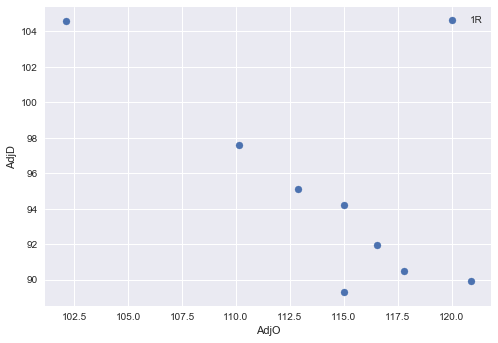

In [252]:
df = df.fillna(0)
x,y = df.groupby('Status').median()['AdjO'],df.groupby('Status').median()['AdjD']
_ = plt.scatter(x,y)
_ = plt.xlabel('AdjO')
_ = plt.ylabel('AdjD')
_ = plt.legend(['1R', 'Out', '2R', 'S16', 'E8', 'FF', 'NCG', 'W'])
plt.show()

In [255]:
df.groupby('Status').median()[['AdjO', 'AdjD']]

,AdjO,AdjD
Status,,
-1.0,110.15,97.60
0.0,102.10,104.60
1.0,112.90,95.10
2.0,115.00,94.20
3.0,116.55,91.95
4.0,117.80,90.50
5.0,115.00,89.30
6.0,120.90,89.90


In [ ]:
# are FF teams statistically significantally better than tourney teams that dont make FF